<img src='https://training.dwit.edu.np/frontend/images/computer-training-institute.png'>
<h1>Data Science and Machine learning in Python</h1>
<h3>Instructor: <a href='https://www.kaggle.com/atishadhikari'> Atish Adhikari</a></h3>
<hr>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling

In [2]:
data = pd.read_csv("datasets/kc_house_data.csv")

In [3]:
data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [4]:
to_drop = ["id", "date", "zipcode", "lat", "long"]

data.drop(to_drop, inplace=True, axis=1)

In [5]:
data.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'sqft_living15',
       'sqft_lot15'],
      dtype='object')

In [6]:
data.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,1340,5650
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,1690,7639
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,2720,8062
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,1360,5000
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,1800,7503


In [7]:
data.profile_report(progress_bar=False)

In [8]:
cat_cols = ["bedrooms", "bathrooms", "floors", "view", "condition", "grade", "waterfront"]

In [9]:
data.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'sqft_living15',
       'sqft_lot15'],
      dtype='object')

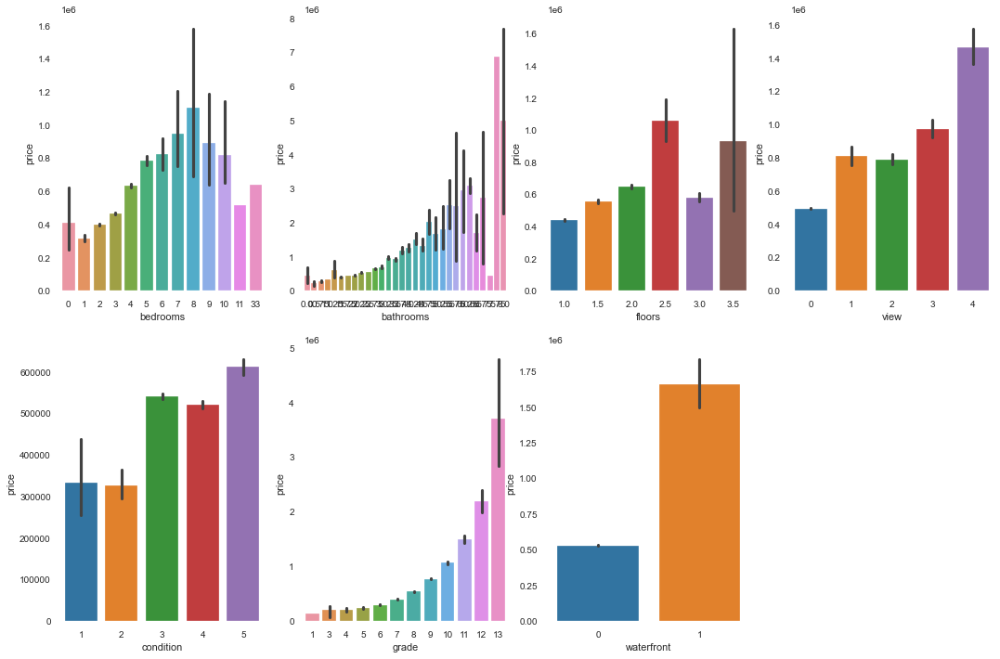

In [10]:
plt.figure(figsize=(18, 12))
for index, col in enumerate(cat_cols):
    plt.subplot(2,4,index+1)
    sns.barplot(col, "price", data=data)
    
plt.show()

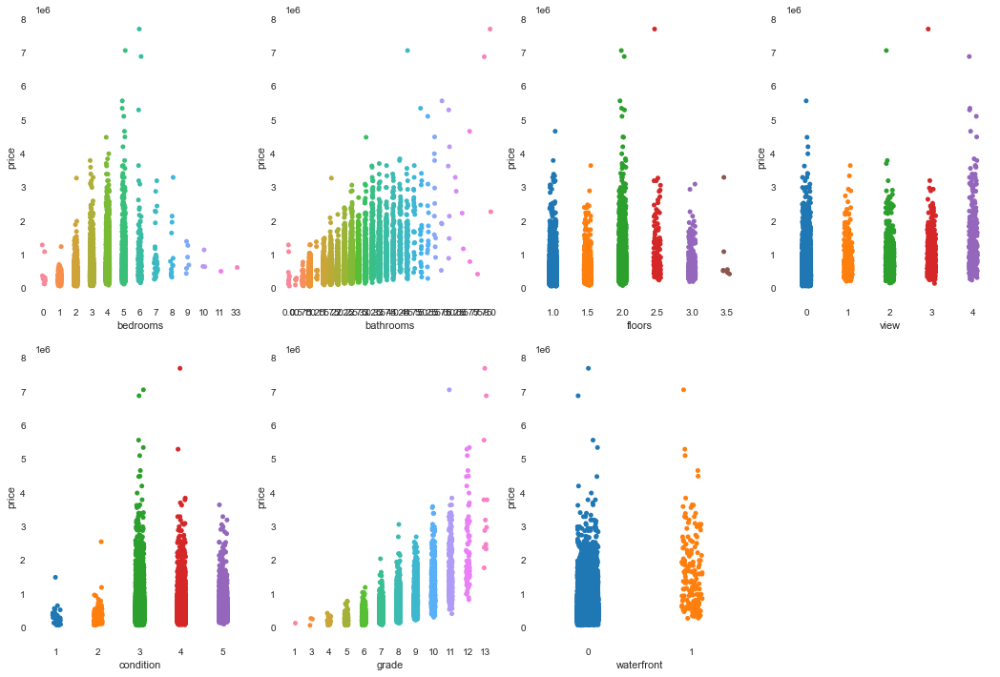

In [11]:
plt.figure(figsize=(18, 12))
for index, col in enumerate(cat_cols):
    plt.subplot(2,4,index+1)
    sns.stripplot(col, "price", data=data)
    
plt.show()



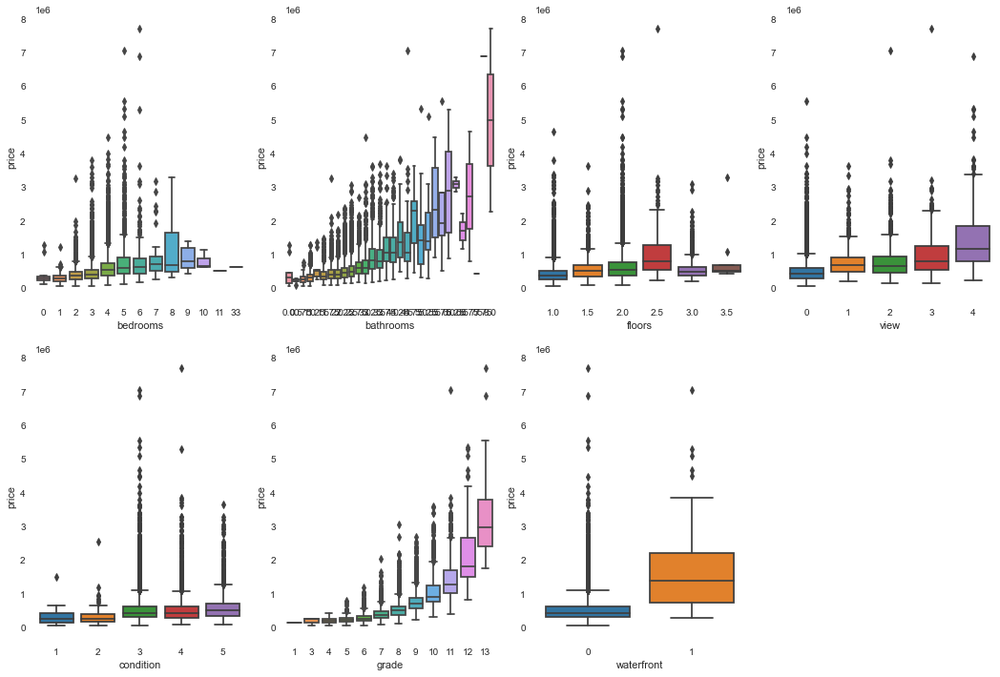

In [12]:
plt.figure(figsize=(18, 12))
for index, col in enumerate(cat_cols):
    plt.subplot(2,4,index+1)
    sns.boxplot(col, "price", data=data)
    
plt.show()

In [13]:
num_cols = [x for x in data.columns if (x not in cat_cols and x != "price")]

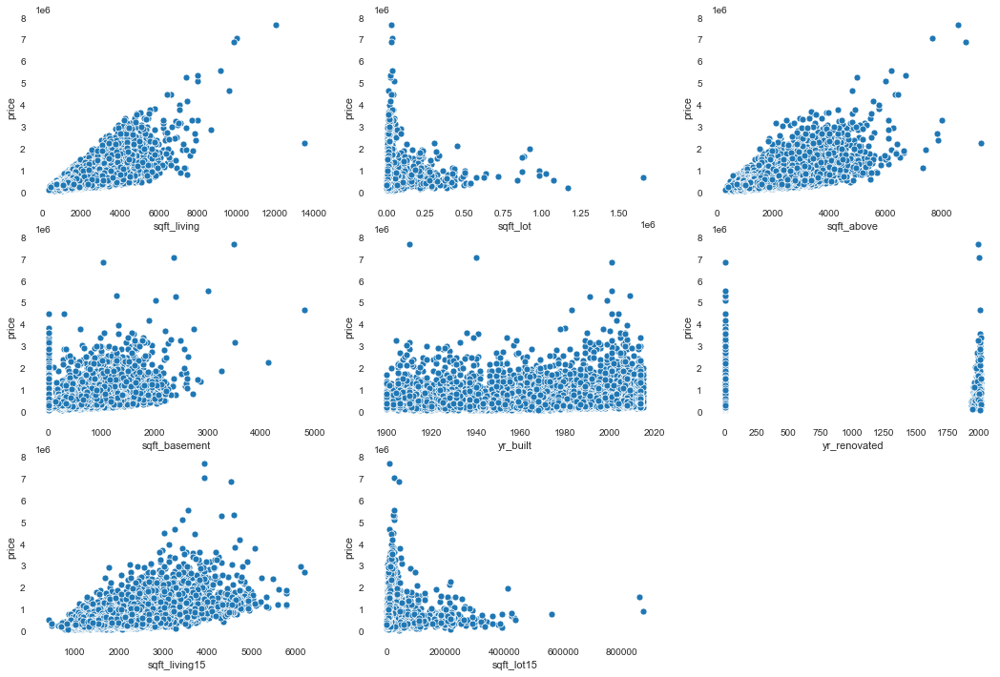

In [14]:
plt.figure(figsize=(18, 12))

for index, col in enumerate(num_cols):
    plt.subplot(3,3,index+1)
    sns.scatterplot(col, "price",  data=data)
    
plt.show()

In [15]:
X = data.drop("price", axis=1)
y = data["price"]

In [16]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [17]:
scaler = StandardScaler()
X = scaler.fit_transform(X)
y = y / 1000 #price scale changed to 1k

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [18]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

In [19]:
X.shape
#in rows in input

(21613, 15)

In [20]:
model = Sequential()

model.add(Dense(input_dim=15, units=12, activation="tanh"))
model.add(Dense(units=8, activation="tanh"))
model.add(Dense(units=4, activation="tanh"))
model.add(Dense(units=1, activation="relu"))

model.compile(loss="mse", metrics=["mae"], optimizer="sgd")

In [21]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 12)                192       
_________________________________________________________________
dense_1 (Dense)              (None, 8)                 104       
_________________________________________________________________
dense_2 (Dense)              (None, 4)                 36        
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 5         
Total params: 337
Trainable params: 337
Non-trainable params: 0
_________________________________________________________________


In [22]:
es = EarlyStopping(monitor="val_loss", patience=8)
checkpoint = ModelCheckpoint("model.h5")

In [23]:
history = model.fit(X_train, y_train, epochs=20, validation_split=0.15, callbacks=[es, checkpoint])

Epoch 1/20
460/460 [==============================] - 1s 1ms/step - loss: 152703.5000 - mae: 250.5144 - val_loss: 121916.4375 - val_mae: 223.9026
Epoch 2/20
460/460 [==============================] - 1s 1ms/step - loss: 131019.3906 - mae: 228.7706 - val_loss: 125199.9766 - val_mae: 227.1395
Epoch 3/20
460/460 [==============================] - 1s 1ms/step - loss: 131749.8438 - mae: 231.1515 - val_loss: 124720.7422 - val_mae: 228.5600
Epoch 4/20
460/460 [==============================] - 1s 1ms/step - loss: 131455.8125 - mae: 230.8783 - val_loss: 124222.4297 - val_mae: 226.1867
Epoch 5/20
460/460 [==============================] - 1s 1ms/step - loss: 131219.7031 - mae: 230.4794 - val_loss: 124302.4297 - val_mae: 223.9536
Epoch 6/20
460/460 [==============================] - 1s 1ms/step - loss: 130911.3984 - mae: 230.3777 - val_loss: 123733.1562 - val_mae: 224.8104
Epoch 7/20
460/460 [==============================] - 1s 1ms/step - loss: 130831.2422 - mae: 230.1370 - val_loss: 125300.171

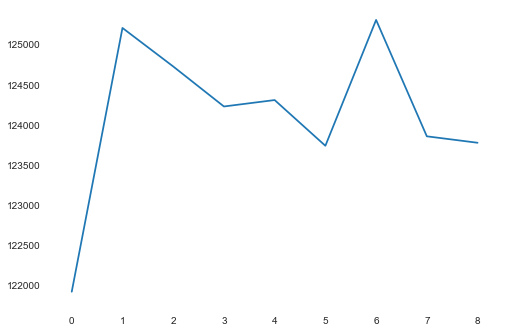

In [24]:
plt.plot(history.history["val_loss"])
plt.show()

In [25]:
from sklearn.metrics import mean_absolute_error, r2_score

In [26]:
y_pred = model.predict(X_test)

In [27]:
mean_absolute_error(y_test, y_pred)

226.6421328922989

In [28]:
r2_score(y_test, y_pred)

0.04831483730753283

In [29]:
model.save_weights("weights.h5")

In [30]:
from tensorflow.keras.models import save_model

In [31]:
save_model(model, "my_model.h5")

In [32]:
from sklearn.svm import SVR

In [33]:
svr = SVR()

In [34]:
svr.fit(X_train, y_train)

SVR()

In [35]:
y_pred = svr.predict(X_test)

In [36]:
mean_absolute_error(y_test, y_pred)

150.9405222755214

In [37]:
r2_score(y_test, y_pred)

0.36710266753520915